### EDA

In [1]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#Ignore warnings
import warnings
warnings.filterwarnings("ignore")

#Import Spray dataset
df_spray=pd.read_csv("../00-Datasets/spray_cleaned.csv")

#Import Train dataset
df_train=pd.read_csv("../00-Datasets/train_cleaned.csv")

#Import Weather dataset
df_weather=pd.read_csv("../00-Datasets/weather_cleaned.csv")

#Merge Train and Weather dataset for EDA
df_train_weather = pd.merge(df_weather, df_train, on=['year', 'month', 'week', 'day', 'day_of_week'])

### Weather Dataset

Take a look at the data types of the weather dataset

In [2]:
df_weather.dtypes

station          int64
date            object
tmax             int64
tmin             int64
tavg             int64
dewpoint         int64
wetbulb          int64
heat             int64
cool             int64
sunrise          int64
sunset           int64
preciptotal    float64
stnpressure    float64
sealevel       float64
resultspeed    float64
resultdir        int64
avgspeed       float64
year             int64
month            int64
week             int64
day              int64
day_of_week      int64
dtype: object

We will take a look at the correlation of numeric variables to wnvpresent > +- 10^-4 (all except for station)

In [3]:
#sort in descending order

df_train_weather.corr()['wnvpresent'].sort_values(ascending = False)

wnvpresent      1.000000e+00
nummosquitos    1.968196e-01
sunrise         1.052275e-01
week            1.041714e-01
month           1.001433e-01
dewpoint        8.563218e-02
wetbulb         8.033394e-02
tmin            7.300490e-02
tavg            6.392866e-02
cool            5.766827e-02
year            5.086477e-02
tmax            4.814037e-02
latitude        2.869683e-02
day_of_week     1.496779e-02
stnpressure     8.680857e-03
day             8.244972e-03
sealevel        6.467982e-03
block           4.877472e-03
resultdir       1.699088e-04
station         1.292215e-16
preciptotal    -2.466604e-04
avgspeed       -2.902903e-02
resultspeed    -4.556707e-02
heat           -5.443937e-02
longitude      -6.034514e-02
sunset         -6.845146e-02
Name: wnvpresent, dtype: float64

We generate the heat map and pairplot of the variables which have correlation > +- 10^-4 with wnvpresent. To note that there are a number of variables which are strongly correlated (> 0.5 or <0.5) with each other. To decide which variables should be selected for our model after we conduct EDA.

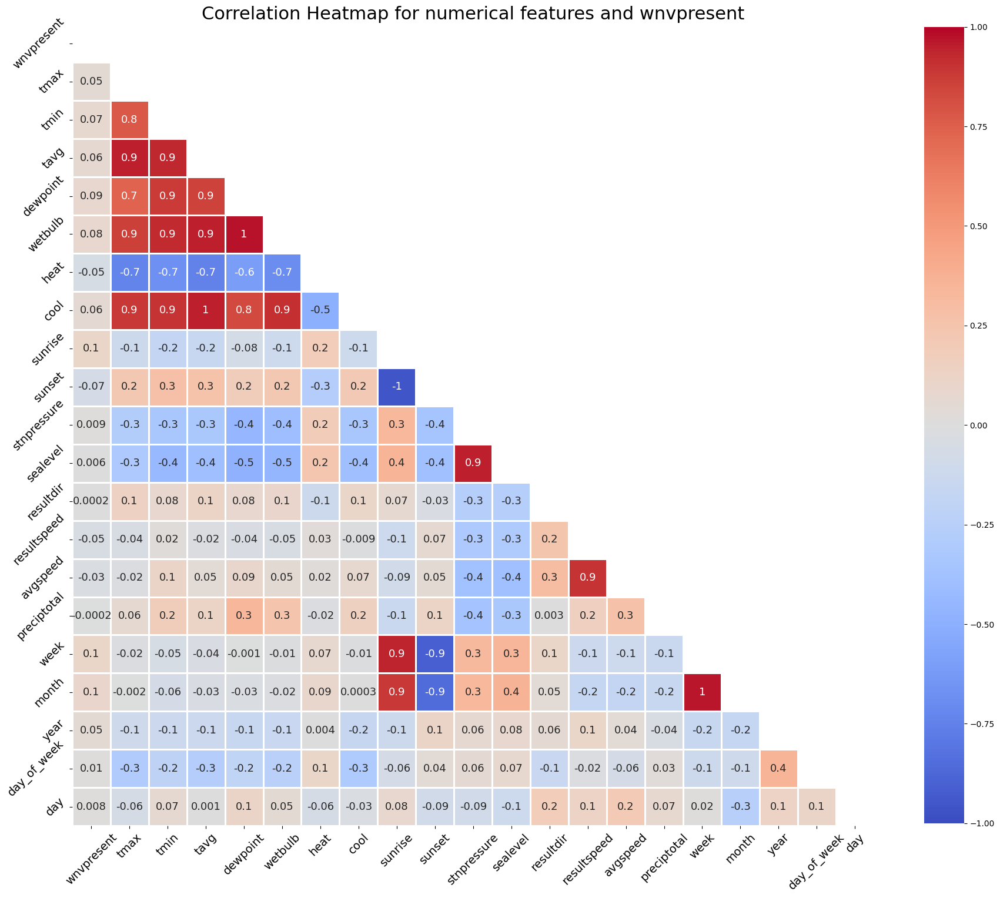

In [4]:
#plot heat map

df_heatmap = df_train_weather.filter(['wnvpresent', 'tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool', 'sunrise', 'sunset', 'stnpressure', 'sealevel', 'resultdir', 'resultspeed', 'avgspeed', 'preciptotal', 'week', 'month', 'year', 'day_of_week', 'day'])

fix, ax = plt.subplots(figsize=(22,22))

mask = np.zeros_like(df_heatmap.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(df_heatmap.corr(), mask=mask, ax=ax, cmap='coolwarm',vmin=-1, vmax=1,
square=True, linewidth=1,annot=True,annot_kws={'size':'13'},
cbar_kws={"shrink": 0.8}, fmt='.1g',center=0)

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14)

plt.xticks(rotation=45)
plt.yticks(rotation=45)

ax.set_title('Correlation Heatmap for numerical features and wnvpresent', fontsize=22);

An interesting insight is that it sea level is highly inversly correlated with stn pressure. 

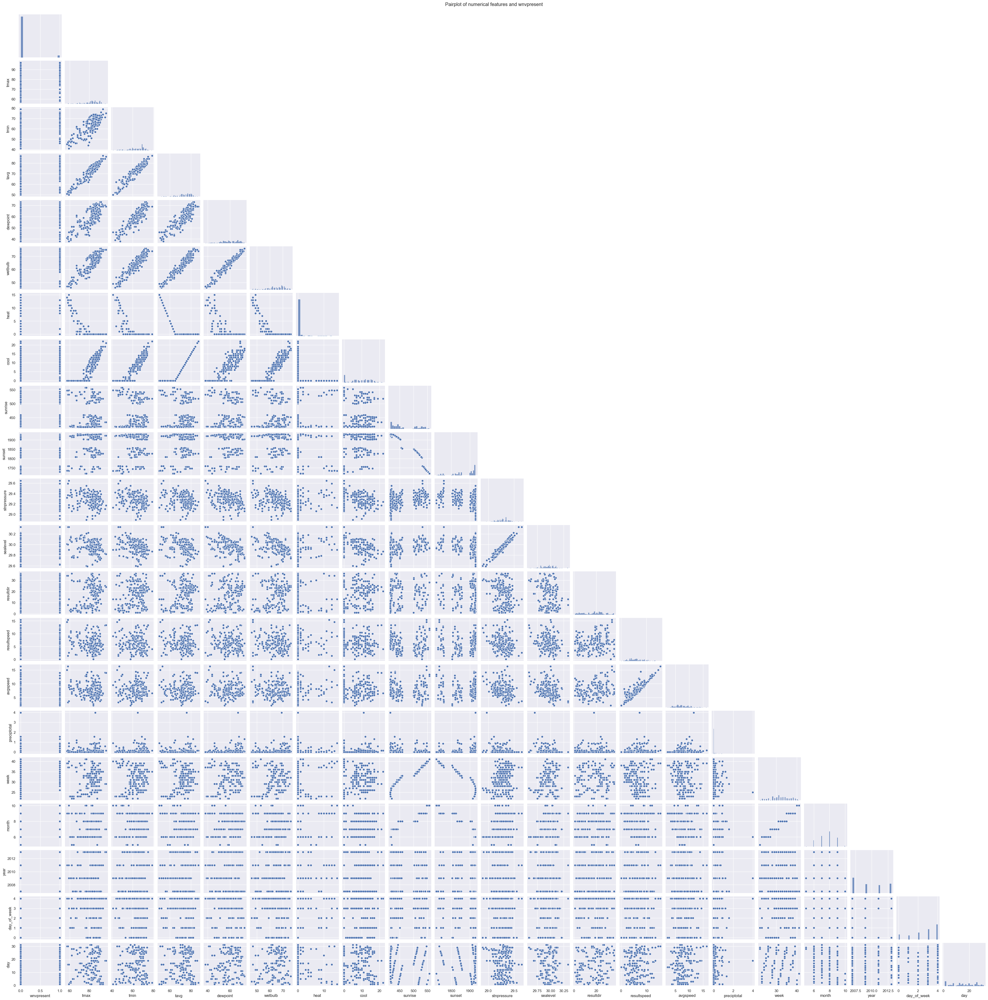

In [5]:
#plot pairplot 

sns.set()
columns = ['wnvpresent', 'tmax', 'tmin', 'tavg', 'dewpoint', 'wetbulb', 'heat', 'cool', 'sunrise', 'sunset', 'stnpressure', 'sealevel', 'resultdir', 'resultspeed', 'avgspeed', 'preciptotal', 'week', 'month', 'year', 'day_of_week', 'day']
df_pairplot = sns.pairplot(df_train_weather[columns], diag_kind="hist", size=2, corner = True)
df_pairplot.fig.suptitle("Pairplot of numerical features and wnvpresent", y=1.00);

We will take a closer look at the variables in the weather dataset against wnvpresent and nummosquitos in the train dataset.

In [6]:
#functions to gen plots to compare with wnvpresent

#define function to gen lineplots_1

def line_plot(x):
    df_plot = df_train_weather.groupby(['year', x])['wnvpresent'].sum().reset_index()
    
    plt.figure(figsize=(20,5))
    
    sns.lineplot(df_plot.loc[df_plot['year']==2007, x],df_plot['wnvpresent'], color='green', label='2007', marker='o')
    sns.lineplot(df_plot.loc[df_plot['year']==2009, x],df_plot['wnvpresent'], color='red', label='2009', marker='o')
    sns.lineplot(df_plot.loc[df_plot['year']==2011, x],df_plot['wnvpresent'], color='orange', label='2011', marker='o')
    sns.lineplot(df_plot.loc[df_plot['year']==2013, x],df_plot['wnvpresent'], color='blue', label='2013', marker='o')

    plt.title('WNV present against ' + x)
    
#define function to gen boxplots

def box_plot(y):
    plt.figure(figsize=(5,4))
    sns.boxplot(x='wnvpresent', y=y, data = df_train_weather)
    plt.title('Boxplot of ' + y + ' and wnvpresent')
    
#define function to gen countplots

def count_plot(z):
    plt.figure(figsize=(20,5))

    sns.countplot(df_train_weather.loc[df_train_weather['year']==2007, z], color='green', label='2007')
    sns.countplot(df_train_weather.loc[df_train_weather['year']==2009, z], color='red', label='2009')
    sns.countplot(df_train_weather.loc[df_train_weather['year']==2011, z], color='orange', label='2011')
    sns.countplot(df_train_weather.loc[df_train_weather['year']==2013, z], color='blue', label='2013')

    plt.title(z + ' across the years')
    plt.legend()

#define function to gen lmplots

def lm_plot(a, b):
    sns.lmplot(x=a, y=b, data=df_train_weather, fit_reg=False, hue='wnvpresent', height=6)
    plt.title(b + ' against ' + a)
    
#function to gen plots to compare with nummosquitos with WNV

#define function to gen lineplots_2

def line_plot_2(c):
    df_plot = df_train_weather.groupby(['year', 'wnvpresent', c])['nummosquitos'].sum().reset_index()
    df_plot = df_plot[df_plot['wnvpresent'] == 1]

    plt.figure(figsize=(20,5))
    
    sns.lineplot(df_plot.loc[df_plot['year']==2007, c],df_plot['nummosquitos'], color='green', label='2007', marker='o')
    sns.lineplot(df_plot.loc[df_plot['year']==2009, c],df_plot['nummosquitos'], color='red', label='2009', marker='o')
    sns.lineplot(df_plot.loc[df_plot['year']==2011, c],df_plot['nummosquitos'], color='orange', label='2011', marker='o')
    sns.lineplot(df_plot.loc[df_plot['year']==2013, c],df_plot['nummosquitos'], color='blue', label='2013', marker='o')

    plt.title('nummosquitoes with WNV against ' + c)
    plt.ylabel('nummosquitoes with WNV')
    
#function to gen plots to compare across months

#define function to gen lineplots_3

def line_plot_3(d):
    
    plt.figure(figsize=(20,5))

    sns.lineplot(df_train_weather.loc[df_train_weather['year']==2007, 'month'], df_train_weather[d], color='green', label='2007', marker='o', ci=None)
    sns.lineplot(df_train_weather.loc[df_train_weather['year']==2009, 'month'], df_train_weather[d], color='red', label='2009', marker='o', ci=None)
    sns.lineplot(df_train_weather.loc[df_train_weather['year']==2011, 'month'], df_train_weather[d], color='orange', label='2011', marker='o', ci=None)
    sns.lineplot(df_train_weather.loc[df_train_weather['year']==2013, 'month'], df_train_weather[d], color='blue', label='2013', marker='o', ci=None)

    plt.title(d + ' across months')

### Presence of WNV in year 2007, 2009, 2011, 2013

Presence of WNV seems to be higher in 2007 and 2013. We expect to see more drastic changes in our plots of wnvpresent and weather features in 2007 and 2013.

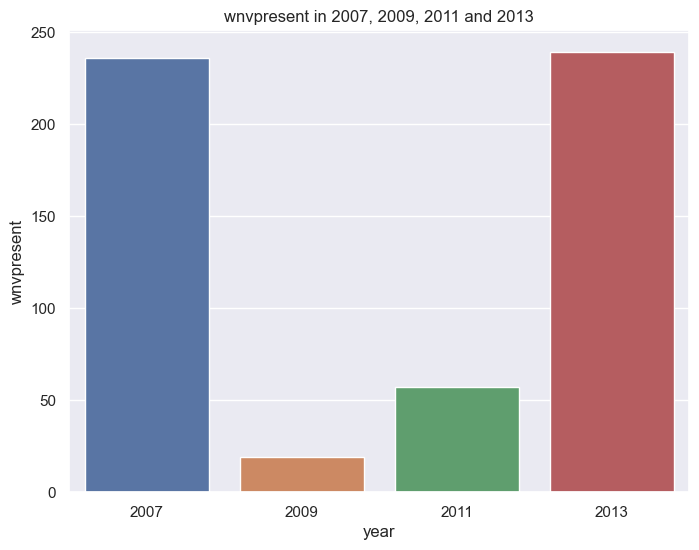

In [7]:
plt.figure(figsize=(8,6))
sns.barplot(data=df_train.groupby(by='year').sum().reset_index(), x='year', y='wnvpresent')
plt.title('wnvpresent in 2007, 2009, 2011 and 2013');

### Sunrise and Sunset

Presence of WNV does not show a clear trend with the timing for sunrise or sunset.

In [8]:
line_plot('sunrise')

TypeError: lineplot() takes from 0 to 1 positional arguments but 2 were given

<Figure size 2000x500 with 0 Axes>

In [ ]:
line_plot('sunset')

### Dewpoint and Wetbulb

Based on the boxplots, WNV is present in higher dewpoint and wetbulb temperatures.

In [ ]:
box_plot('dewpoint')

In [ ]:
box_plot('wetbulb')

At higher temperature, presence of WNV is more prevalent and there are more mosquitoes with WNV. This can be seen from the lineplots below where the sum of wnvpresent and mosquitoes with WNV increases when dewpoint and wetbulb temperature is anywhere between 50 to 60 degrees fahrenheit. The sum of wnvpresent seems to have a more drastic increase in 2007 and 2013 probably due to higher tavg in these two years as seen from the countplot - large proportion of the tavg in 2007 and 2013 is above 70 degrees fahrenheit.

In [ ]:
line_plot('dewpoint')

In [ ]:
line_plot_2('dewpoint')

In [ ]:
line_plot('wetbulb')

In [ ]:
line_plot_2('wetbulb')

In [ ]:
count_plot('tavg')

### Tmin, Tmax and Tavg

Based on the scatter plot, higher tmax and tmin temperatures contributes to higher prevalence of WNV. <br>

WNV and number of mosquitoes with WNV was prevalent in 2007 and 2013 when average temperature is above 70 degrees fahrenheit seen from the lineplot below.

In [ ]:
lm_plot('tmin', 'tmax')

In [ ]:
line_plot('tavg')

In [ ]:
line_plot_2('tavg')

We can see from the lineplot below that temperatures (tavg) tend to peak between month 6-8 (June-Aug) which also coincides with the Summer in the US.

In [ ]:
line_plot_3('tavg')

### Heat and Cool

Average temperature across the years was generally not higher than the base 65 degree fahrenheit (heat) as seen from the countplot. <br>

However, it was at times cooler than the base 65 degree fahrenheit. We can take a look at the boxplot for cool.

In [ ]:
count_plot('heat')

The feature cool did not seem to play a part on the presence of WNV as seen from the similarities in boxplot for both wnvpresent = 0 and 1.

In [ ]:
box_plot('cool')

### Sealevel and Stnpressure

Average sea level and station pressure did not seem to contribute to the presence of WNV as various spikes can be seen across different average sea level and station pressure.

In [ ]:
line_plot('sealevel')

In [ ]:
line_plot('stnpressure')

### Avgspeed, Resultspeed and Resultdir

Resultant wind direction did not seem to play a part on the presence of WNV as seen from the boxplot.

In [ ]:
box_plot('resultdir')

Lower resultant and average wind speed (<12 mph) seems to contribute to higher presence of WNV as seen from the boxplot.

In [ ]:
box_plot('resultspeed')

In [ ]:
box_plot('avgspeed')

Based on the lineplots, WNV presence and number of mosquitoes with WNV is highest at avgspeed 4-12mph and resultspeed 2-10mph. At speeds higher than this range, WNV and mosquitoes with WNV does not seem to be so prevalent.

In [ ]:
line_plot('avgspeed')

In [ ]:
line_plot_2('avgspeed')

In [ ]:
line_plot('resultspeed')

In [ ]:
line_plot_2('resultspeed')

Average wind speed is generally quite low across the year and dips during the Summer (month 6-8). Average wind speed increased in July 2007 probably due to more extreme weather condition during that period<a href="https://www.weather.gov/iwx/20070726_supercell" target="_blank"><sup>1</sup></a>.

In [ ]:
line_plot_3('avgspeed')

### Preciptotal

It seems that lower total precipitation levels (<1.0 inch) would actually contribute to larger proportion of WNV and number of mosquitoes with WNV as seen from the lineplots below. <br>

However, at higher total precipitation levels (>1.0 inch), this is no longer true. At higher total precipitation levels, water levels due to rainfall and melted snow would be higher and that would mean that temperatures are lower, which probably explains why this is no longer true at higher total precipitation levels.

In [ ]:
line_plot('preciptotal')

In [ ]:
line_plot_2('preciptotal')

Low total precipitation levels are seen during the Summer (month 6-8).

In [ ]:
line_plot_3('preciptotal')

## Spray Dataset

Take a look at the data types of the spray dataset

In [9]:
df_spray.dtypes

date            object
time            object
latitude       float64
longitude      float64
year             int64
month            int64
week             int64
day              int64
day_of_week      int64
dtype: object

Plot the Pairplot and heat map to find any relationship between each numerical variable in the spray dataset. In general, longitude and latitude hae strong correlation and date variables have strong correlation to one another.

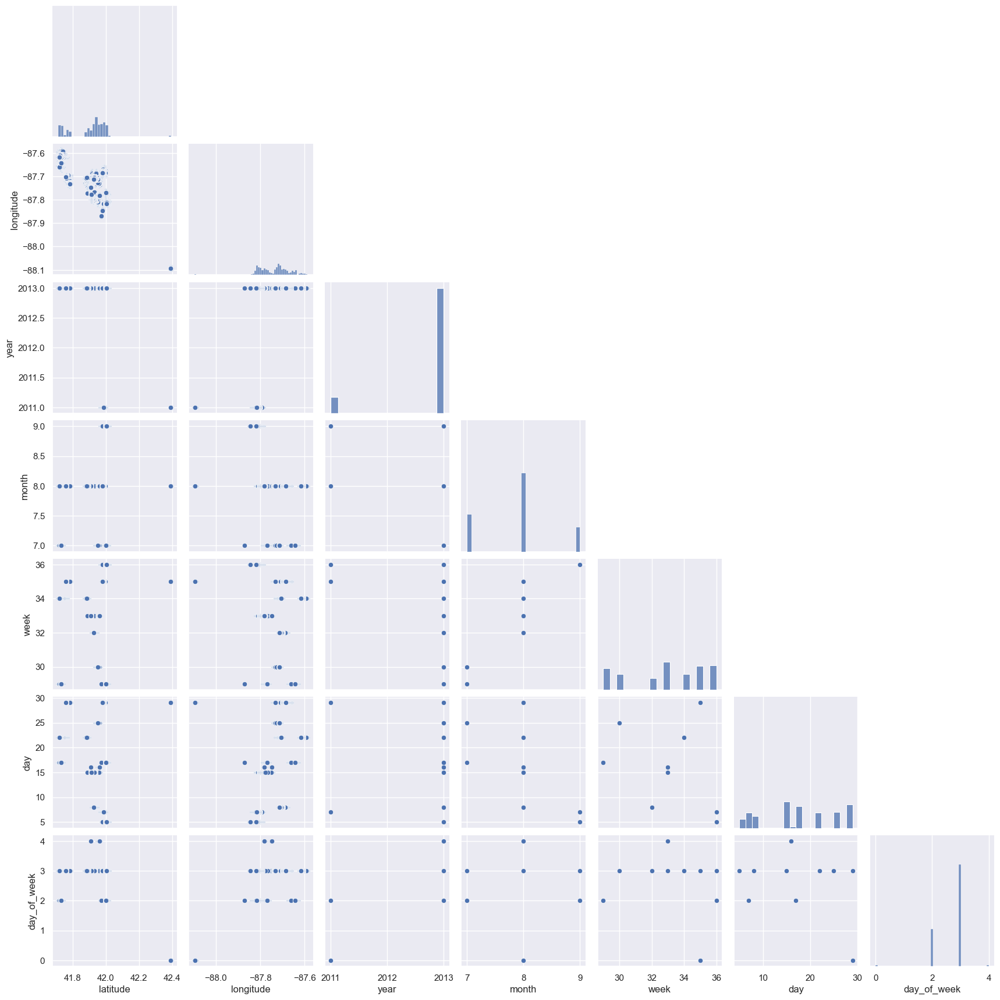

In [10]:
#pairplot

sns.pairplot(df_spray,corner=True)

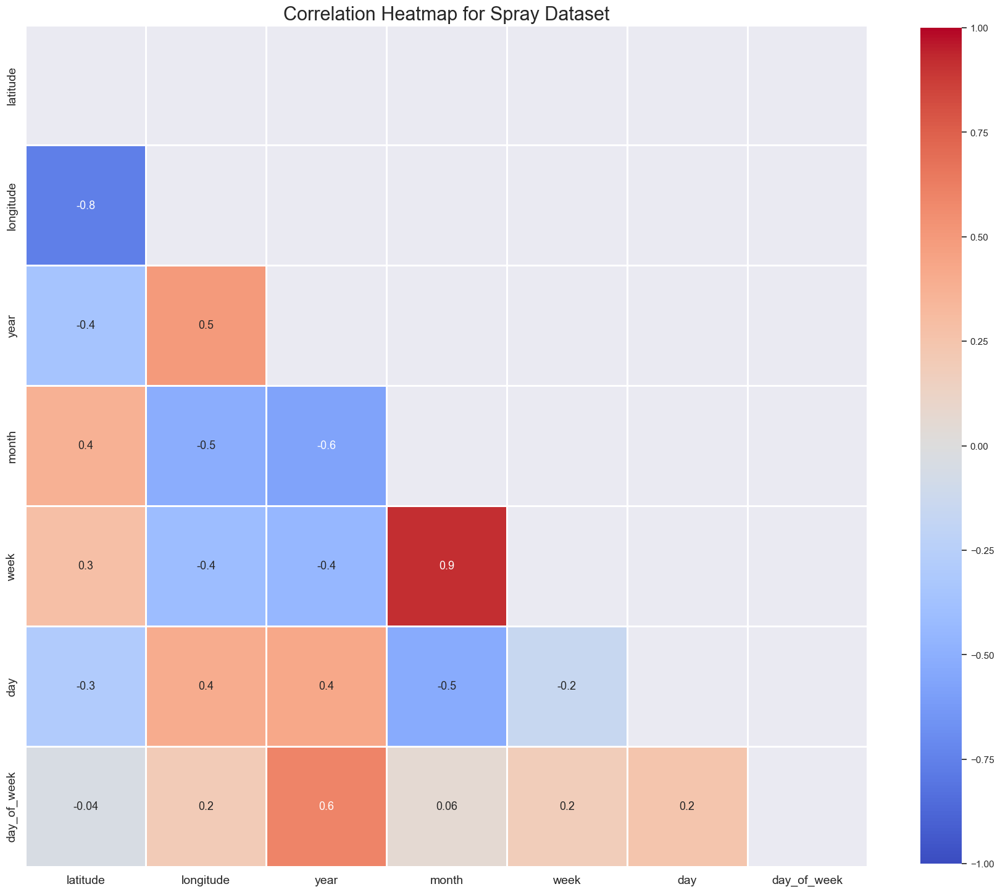

In [11]:
#heat map

fix, ax = plt.subplots(figsize=(22,22))

mask = np.zeros_like(df_spray.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(df_spray.corr(), mask=mask, ax=ax, cmap='coolwarm',vmin=-1, vmax=1,
square=True, linewidth=1,annot=True,annot_kws={'size':'13'},
cbar_kws={"shrink": 0.8}, fmt='.1g',center=0)

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14)

ax.set_title('Correlation Heatmap for Spray Dataset', fontsize=22);

In [12]:
MAPBOX_TOKEN = 'pk.eyJ1IjoibWFyaWVkcmV6IiwiYSI6ImNsOXl5dTFtZjAyYm4zd28zN3Y1ZzYycm0ifQ.W1Toe6X5S9AELY56h0OQDw'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(df_spray, lat = 'latitude', lon  = 'longitude',animation_frame="date",size_max=15, zoom = 10)

fig.update_layout(title = 'Spray Locations from 2011-2013',
    autosize=False,
    width=500,
    height=700,)

fig.show()

From the above map, we can see the locations where the spray was done at different duration of time.

## Train Dataset

Take a look at the data types of the train dataset

In [13]:
df_train.dtypes

date             object
address          object
species          object
block             int64
street           object
trap             object
latitude        float64
longitude       float64
nummosquitos      int64
wnvpresent        int64
year              int64
month             int64
week              int64
day               int64
day_of_week       int64
dtype: object

Plot the Pairplot and heat map to find any relationship between each numerical variable in the train dataset. In general, longitude, latitude and addressaccuracy have strong correlation with one another, date variables have strong correlation to one another and wnvpresent and nummosquitos have strong correlation with each other.

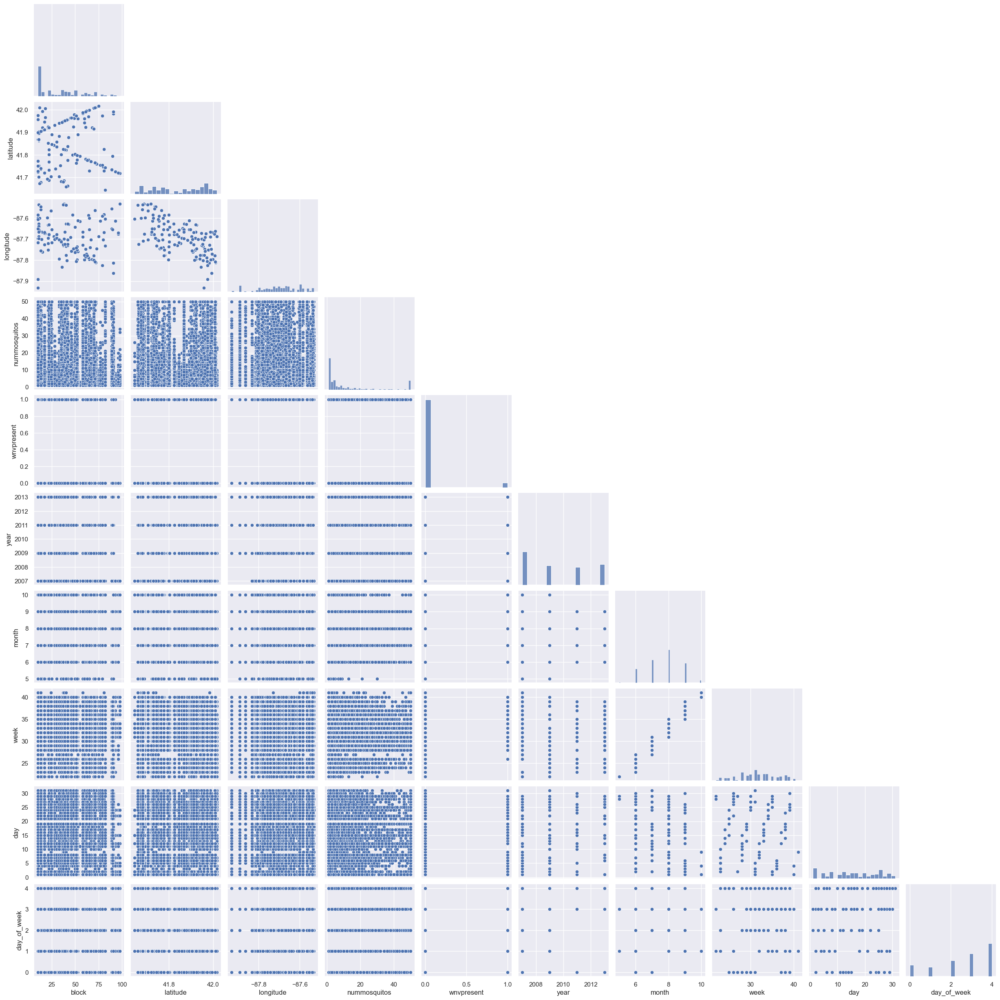

In [14]:
#Pairplot

sns.pairplot(df_train,corner=True)

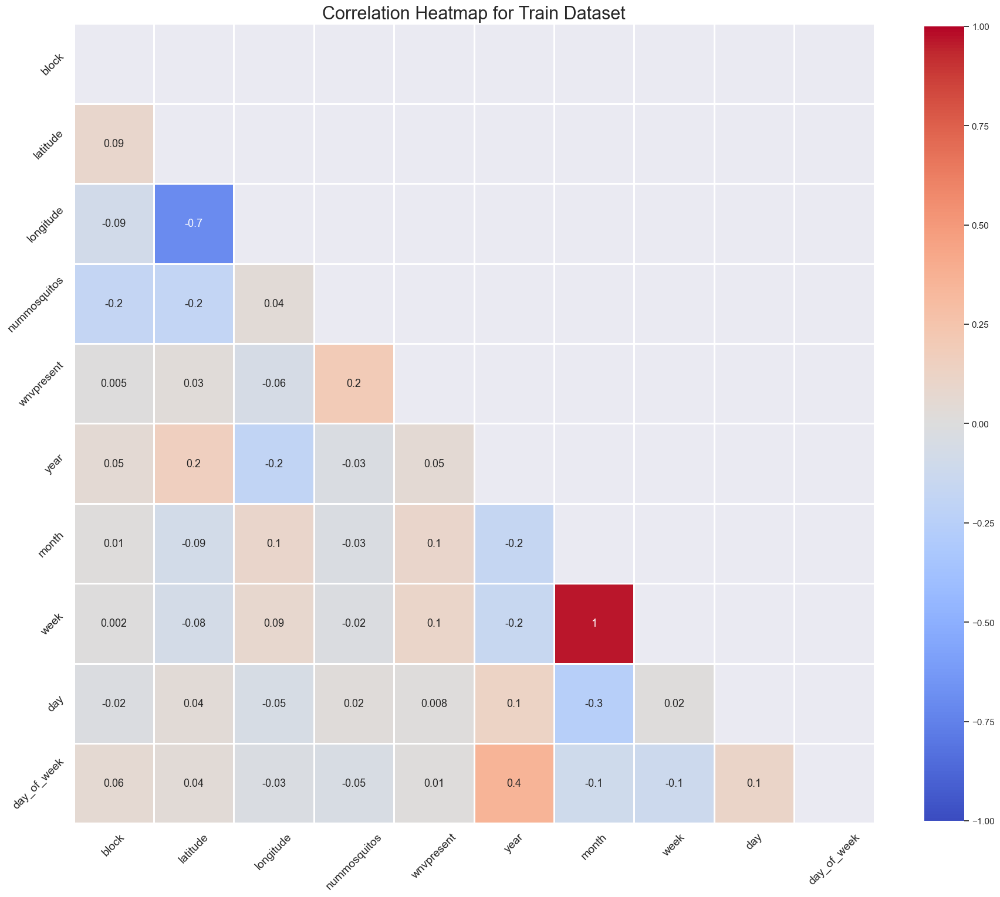

In [15]:
#heat map

fix, ax = plt.subplots(figsize=(22,22))

mask = np.zeros_like(df_train.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(df_train.corr(), mask=mask, ax=ax, cmap='coolwarm',vmin=-1, vmax=1,
square=True, linewidth=1,annot=True,annot_kws={'size':'13'},
cbar_kws={"shrink": 0.8}, fmt='.1g',center=0)

ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14)
ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14)

plt.xticks(rotation=45)
plt.yticks(rotation=45)

ax.set_title('Correlation Heatmap for Train Dataset', fontsize=22);

In [16]:
MAPBOX_TOKEN = 'pk.eyJ1IjoibWFyaWVkcmV6IiwiYSI6ImNsOXl5dTFtZjAyYm4zd28zN3Y1ZzYycm0ifQ.W1Toe6X5S9AELY56h0OQDw'
px.set_mapbox_access_token(MAPBOX_TOKEN)
fig = px.scatter_mapbox(df_train, lat = 'latitude', lon  = 'longitude',animation_frame="date",size_max=15, zoom = 10)

fig.update_layout(title = 'Traps Locations from 2007-2013',
    autosize=False,
    width=500,
    height=700,)

fig.show()

From the above map, we can see the locations where the traps was at different duration of time.

### Number of Mosquitoes from 2007 - 2013

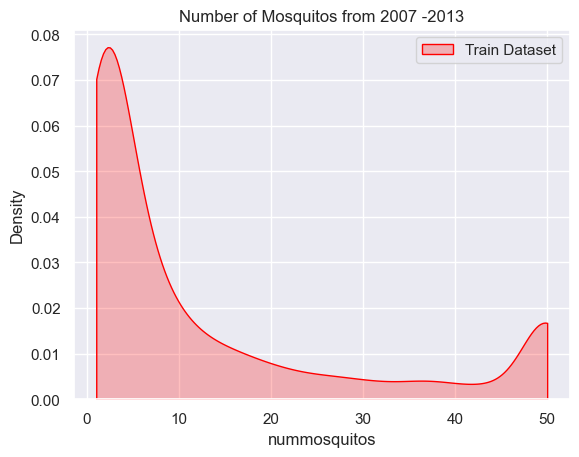

In [17]:
fig=sns.kdeplot(df_train["nummosquitos"],color="red",fill=True,cut=0,label="Train Dataset")
fig.legend()
fig.set_title("Number of Mosquitos from 2007 -2013")
plt.show()

From the above distribution plot, it is observed that there are 2 peaks, which means that most of the trap only caught either a few mosquitos or 50 mosquitos. 
The name of distribution for 2 peaks is called [bimodal distribution](https://www.thoughtco.com/definition-of-bimodal-in-statistics-3126325) and it indicates that the data might be from [different systems](https://www.pqsystems.com/qualityadvisor/DataAnalysisTools/interpretation/histogram_shape.php#:~:text=How%20would%20you%20describe%20the,come%20from%20two%20different%20systems.). 
The following below are the possiblities for bimodal distributions:
1. There might be a change in traps and trap brands inbetween 2007 to 2013. With different traps, there might be a change in the effectivness of trap.
2. It represents different breeds of mosquitos found in [different habitats](https://portal.ct.gov/-/media/CAES/Mosquito-Testing/Mosquito-Borne-Disease-Symposium-2019/Shepard_CAES_Mosquito-Biology.pdf). 
3. Depending on the weather/seasons, mosquitos are active in certain [weathers and seasons](https://link.springer.com/article/10.1007/s10393-016-1176-y).

### Number of Mosquitos and areas

In [18]:
MAPBOX_TOKEN = 'pk.eyJ1IjoibWFyaWVkcmV6IiwiYSI6ImNsOXl5dTFtZjAyYm4zd28zN3Y1ZzYycm0ifQ.W1Toe6X5S9AELY56h0OQDw'
px.set_mapbox_access_token(MAPBOX_TOKEN)

#Count the number of mosquitos in areas
mosquito_count = df_train.groupby(['address'], as_index = False)[['nummosquitos']].sum()
#Group the area by address and use the median address
areas = df_train.groupby(['address'], as_index = False)[['latitude','longitude']].median()

#Group the wnvpresent by address
wnv = df_train.groupby(['address'], as_index = False)[['wnvpresent']].sum() 

#Merge mosquitocount , areas and wnvpresent together
mosquito_areas_wnv = pd.concat([mosquito_count,areas, wnv], axis = 1)

#Drop the address as it is not required
mosquito_areas_wnv.drop('address', axis = 1, inplace = True)

fig = px.scatter_mapbox(mosquito_areas_wnv, lat = 'latitude', lon  = 'longitude', color = 'wnvpresent',
                        size = 'nummosquitos', color_continuous_scale=px.colors.cyclical.Edge,
                        hover_data = ['nummosquitos', 'wnvpresent'],
                       zoom = 9,
                       width=500,
                       height=700)

fig.show()

From the interactive graph, the following are the highlights:
1. The highest wnvpresent,shown in gray, occurs near Elk Grove Village which has around 66 wnvpresent.
2. The second wnvpresent,shown in yellow, occurs near Blue Island which has 44 wnvpresent.

In [19]:
MAPBOX_TOKEN = 'pk.eyJ1IjoibWFyaWVkcmV6IiwiYSI6ImNsOXl5dTFtZjAyYm4zd28zN3Y1ZzYycm0ifQ.W1Toe6X5S9AELY56h0OQDw'
px.set_mapbox_access_token(MAPBOX_TOKEN)

fig = px.scatter_mapbox(df_spray, lat = 'latitude', lon  = 'longitude',#animation_frame = 'Date',
                        size_max=15, zoom = 9,color_discrete_sequence=["palegoldenrod"],  opacity = 0.5,
                        width=500,
                       height=700)

fig2 = px.scatter_mapbox(mosquito_areas_wnv, lat = 'latitude', lon  = 'longitude', color = 'wnvpresent',
                        size = 'nummosquitos', color_continuous_scale=px.colors.cyclical.Edge,
                        hover_data = ['nummosquitos', 'wnvpresent'],
                       zoom = 9,
                       width=500,
                       height=700)

fig.add_trace(fig2.data[0],)

fig.update_layout( title = 'Spray relationship with Virus and Mosquito clusters')

From above interactive plot, the spray area shown in dark yellow, is effective in reducing the mosquito.

### Presence of WNV in Mosquitos

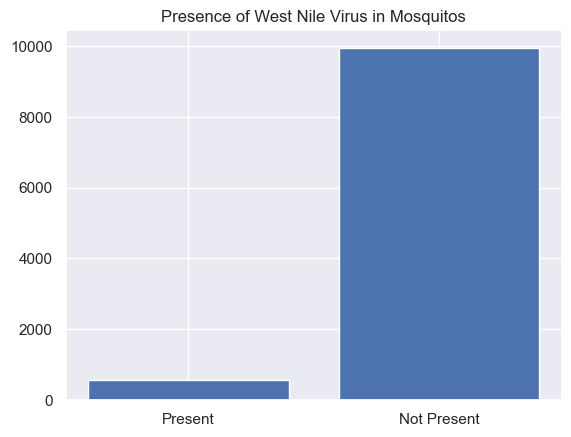

In [20]:
#Plot frequency of the present of West Nile Virus was present in these mosquitos
count_pos=0
count_neg=0
for nums in df_train['wnvpresent']:
    if nums==1:
        count_pos+=1
    else:
        count_neg+=1
values_total=[count_pos,count_neg]
labels=["Present","Not Present"]
plt.bar(labels,values_total)
plt.title("Presence of West Nile Virus in Mosquitos")
plt.show()

Based on the above bar plot, it is observed that most of the mosquitos does not carry West Nile Virus.

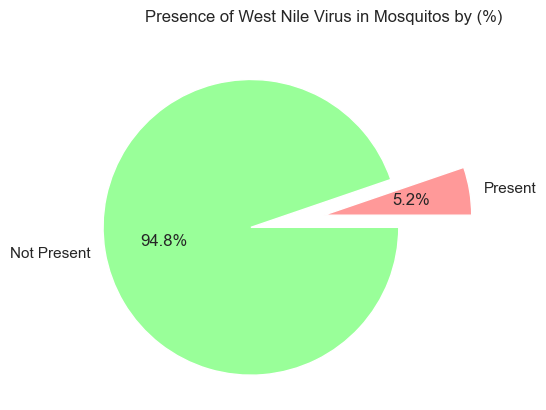

In [21]:
# Creating autocpt arguments
def func(pct, allvalues):
    absolute = int(pct / 100.*np.sum(allvalues))
    return "{:.1f}%".format(pct, absolute)

# only "explode" the 2nd slice (i.e. 'Hogs')
explode = (0, 0.5)

#add colors
colors = ['#ff9999','#99ff99']

#plt.figure()
pie_mosquitos=plt.pie(values_total, labels=labels ,autopct=lambda pct: func(pct,values_total),explode=explode,
                      colors=colors)
plt.title("Presence of West Nile Virus in Mosquitos by (%)")
plt.show()

Based on the above pie plot, it is observed that 94.8% of the mosquitos did not carry West Nile Virus. Only 5.2% of the mosquitos carry the West Nile Virus.

### Trap Area

In [22]:
fig2 = px.scatter_mapbox(mosquito_areas_wnv, lat = 'latitude', lon  = 'longitude', color = 'wnvpresent',
                        size = 'nummosquitos', color_continuous_scale=px.colors.cyclical.Twilight_r,
                        hover_data = ['nummosquitos', 'wnvpresent'],
                       zoom = 9)

fig3 = px.scatter_mapbox(df_train, lat = 'latitude', lon  = 'longitude',
                        size_max=15, zoom = 10, color_discrete_sequence = ["red"])

#print figure object as is to see the elements inside
fig2.add_trace(fig3.data[0]) 

fig2.update_layout( title = 'Trap relationship with Virus and Mosquito clusters',
                width=500, height=700)

From above interactive plot, the trap area ,shown dark red, is effective in trapping mosquitos with wnvpresent.

### wnvpresent by Week

       week  wnvpresent
0        22           0
1        22           0
2        22           0
3        22           0
4        22           0
...     ...         ...
21007    39           1
21008    39           0
21009    39           0
21010    39           0
21011    39           0

[21012 rows x 2 columns]


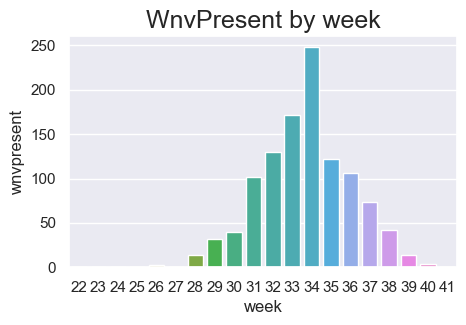

In [23]:
#wnvpresent by week
wnvpresent_week=df_train_weather[["week","wnvpresent"]]
print(wnvpresent_week)

fig, ax = plt.subplots(1,1,figsize=(5,3))
sns.barplot(data=wnvpresent_week.groupby(by='week').sum().reset_index(), x='week', y='wnvpresent', ax=ax)
plt.title('WnvPresent by week', fontsize=18);

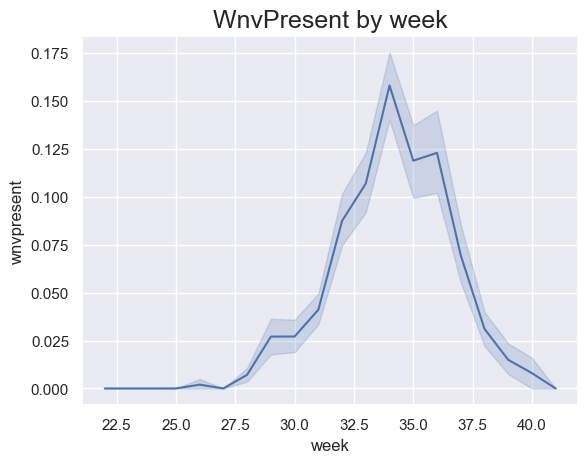

In [24]:
plt.title('WnvPresent by week', fontsize=18);
sns.lineplot(data=wnvpresent_week,x="week",y="wnvpresent");

From the graph, we can see that the wnvpresent peak at around week 34 ,which coincides with the [summer period](https://www.calendarr.com/united-states/seasons-of-the-year-in-the-united-states/#:~:text=Summer%20lasts%20from%20June%2020,are%20longer%20than%20the%20evenings.).

### wnvpresent by Month

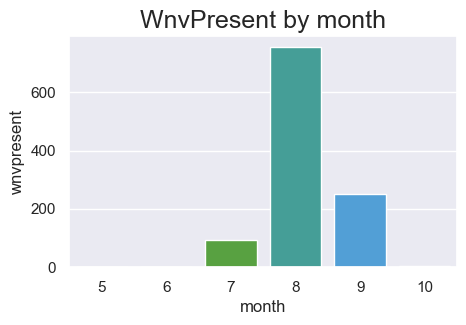

In [25]:
#wnvpresent by month
wnvpresent_month=df_train_weather[["month","wnvpresent"]]

fig, ax = plt.subplots(1,1,figsize=(5,3))
sns.set_style(style="white")
sns.barplot(data=wnvpresent_month.groupby(by='month').sum().reset_index(), x='month', y='wnvpresent', ax=ax,palette = "husl")
plt.title('WnvPresent by month', fontsize=18);

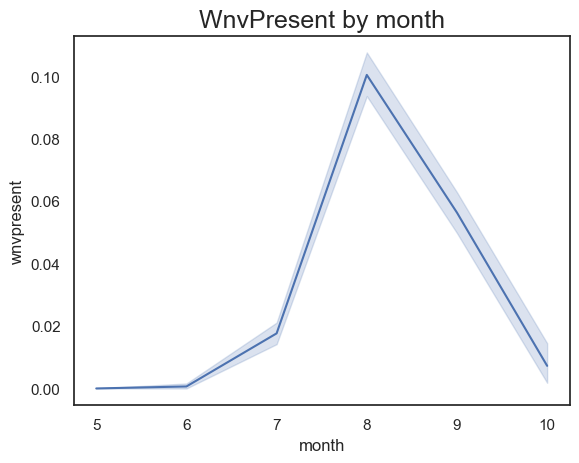

In [26]:
plt.title('WnvPresent by month', fontsize=18);
sns.lineplot(data=wnvpresent_month,x="month",y="wnvpresent");

From the graph, we can see that the wnvpresent peak at around August ,which coincides with the [summer period](https://www.calendarr.com/united-states/seasons-of-the-year-in-the-united-states/#:~:text=Summer%20lasts%20from%20June%2020,are%20longer%20than%20the%20evenings).

### wnvpresent by Year

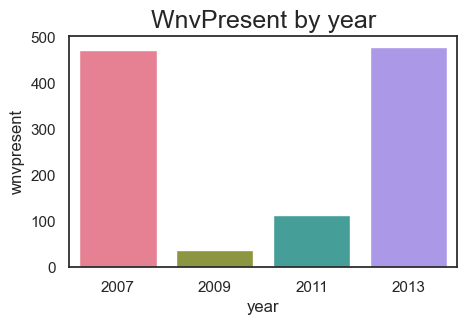

In [40]:
#wnvpresent by month
wnvpresent_year=df_train_weather[["year","wnvpresent"]]

fig, ax = plt.subplots(1,1,figsize=(5,3))
sns.set_style(style="white")
sns.barplot(data=wnvpresent_year.groupby(by='year').sum().reset_index(), x='year', y='wnvpresent', ax=ax,palette = "husl")
plt.title('WnvPresent by year', fontsize=18);

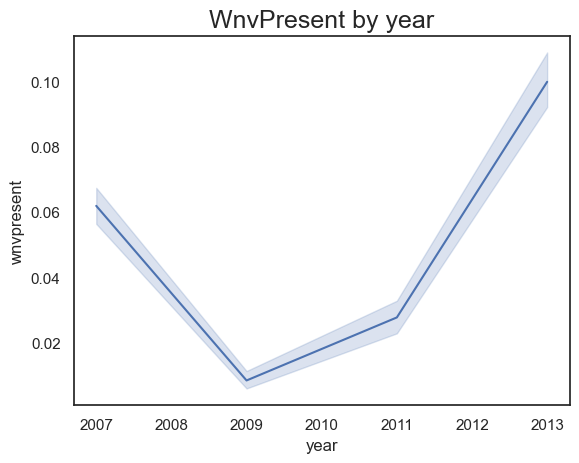

In [41]:
plt.title('WnvPresent by year', fontsize=18);
sns.lineplot(data=wnvpresent_year,x="year",y="wnvpresent");

### nummosquitos by Week

       week  nummosquitos
0        22             1
1        22             1
2        22             1
3        22             1
4        22             4
...     ...           ...
21007    39             6
21008    39             5
21009    39             1
21010    39             5
21011    39             1

[21012 rows x 2 columns]


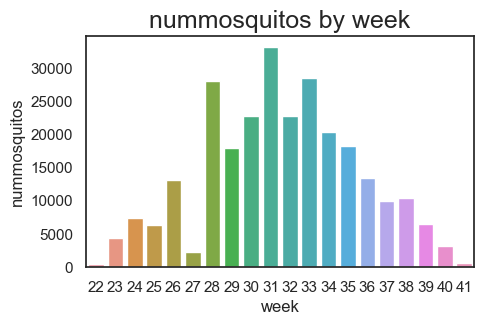

In [27]:
#nummosquitos by week
nummosquitos_week=df_train_weather[["week","nummosquitos"]]
print(nummosquitos_week)

fig, ax = plt.subplots(1,1,figsize=(5,3))
sns.barplot(data=nummosquitos_week.groupby(by='week').sum().reset_index(), x='week', y='nummosquitos', ax=ax)
plt.title('nummosquitos by week', fontsize=18);

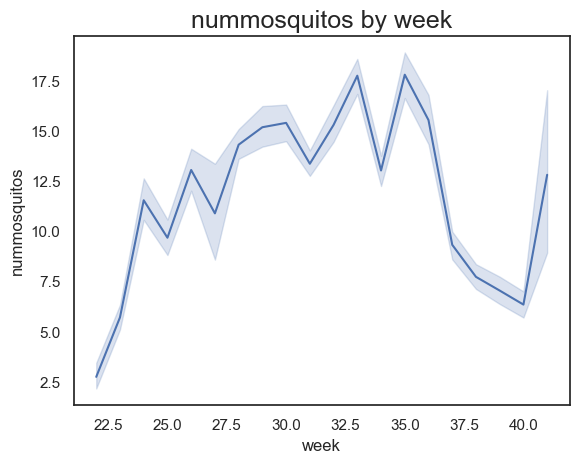

In [28]:
plt.title('nummosquitos by week', fontsize=18);
sns.lineplot(data=nummosquitos_week,x="week",y="nummosquitos");

From the graph, we can see that the number of mosquito peak at around week 31 ,which is the [summer period](https://www.calendarr.com/united-states/seasons-of-the-year-in-the-united-states/#:~:text=Summer%20lasts%20from%20June%2020,are%20longer%20than%20the%20evenings). Comparing to the wnvpresent graph, it is observed that there is a delay from the number of mosquitos cases to the wnvpresent cases, where the number of mosquitos peaked at week 31 and wnvpresent peaked at week 34.

### nummosquitos by Month

       month  nummosquitos
0          5             1
1          5             1
2          5             1
3          5             1
4          5             4
...      ...           ...
21007      9             6
21008      9             5
21009      9             1
21010      9             5
21011      9             1

[21012 rows x 2 columns]


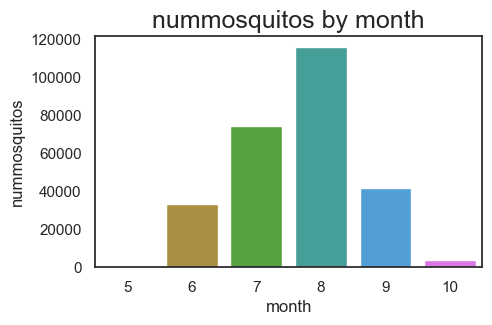

In [29]:
#nummosquitos by month
nummosquitos_month=df_train_weather[["month","nummosquitos"]]
print(nummosquitos_month)

fig, ax = plt.subplots(1,1,figsize=(5,3))
sns.barplot(data=nummosquitos_month.groupby(by='month').sum().reset_index(), x='month', y='nummosquitos', ax=ax,palette = "husl")
plt.title('nummosquitos by month', fontsize=18);

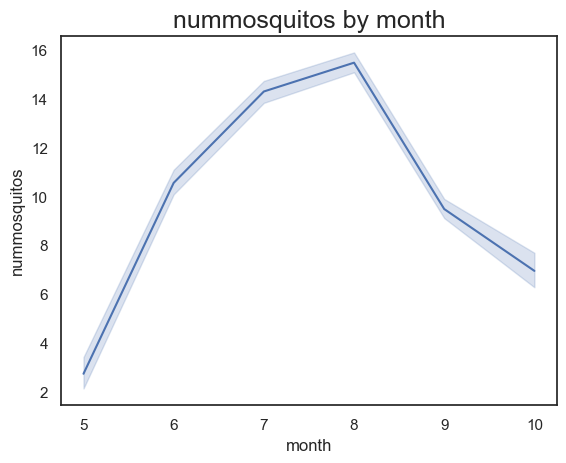

In [30]:
plt.title('nummosquitos by month', fontsize=18);
sns.lineplot(data=nummosquitos_month,x="month",y="nummosquitos");

From the graph, it is observed that the number of mosquito peak at around August, which is the [summer period](https://www.calendarr.com/united-states/seasons-of-the-year-in-the-united-states/#:~:text=Summer%20lasts%20from%20June%2020,are%20longer%20than%20the%20evenings). The peak is similar to the wnvpresent graph, which suggest that the number of wnvpresent is highly related to the number of mosquitos.

### Species by Week

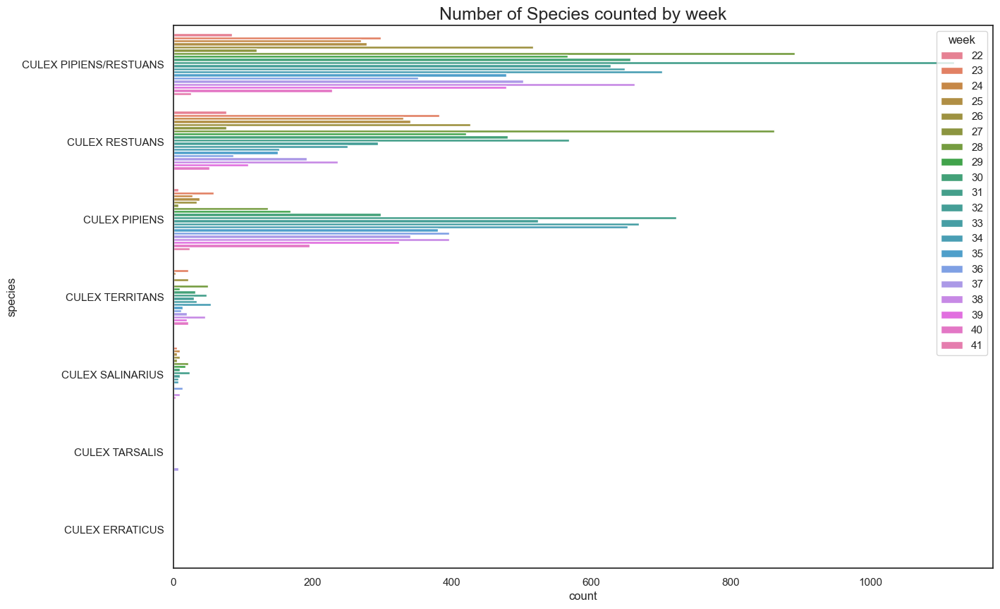

In [31]:
#species by week
species_week=df_train_weather[["week","species"]]
species_count_week=species_week.groupby("week").value_counts()
df_species_count_week=species_count_week.to_frame().reset_index()
df_species_count_week.rename(columns={0:"count"},inplace=True)

fig, ax = plt.subplots(1,1,figsize=(15,10))

sns.barplot(data=df_species_count_week, y="species", x='count',ax=ax,ci=None,palette = "husl",hue="week")
plt.title('Number of Species counted by week', fontsize=18)
plt.show()

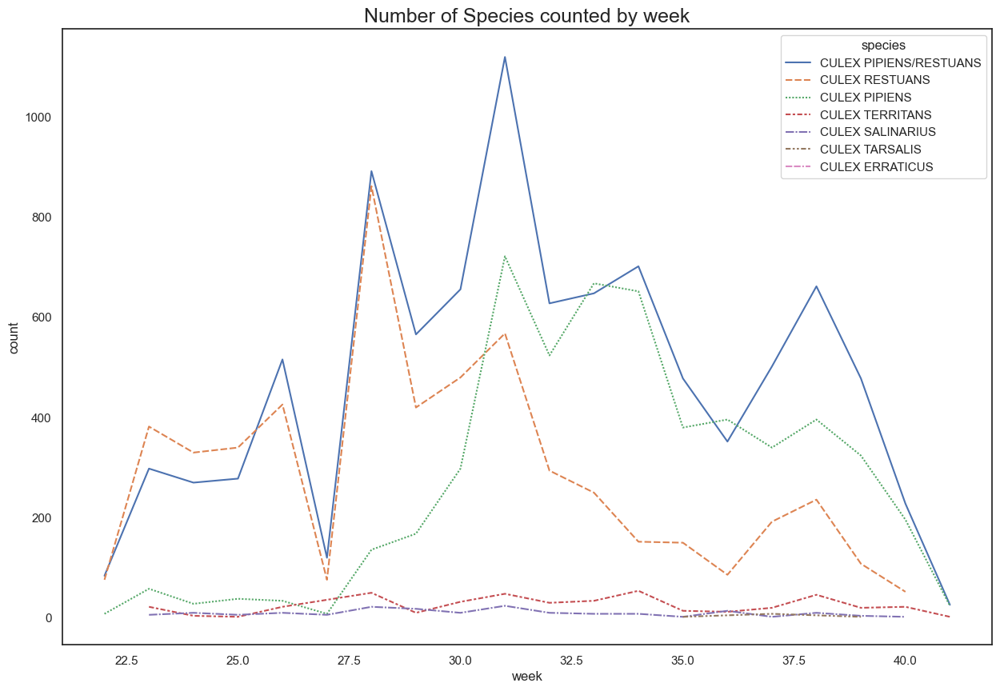

In [32]:
plt.figure(figsize=(15,10))
plt.title('Number of Species counted by week', fontsize=18)
sns.lineplot(data=df_species_count_week,x="week",y="count",hue="species",style="species");

From the above plot, it is observed that the number of culex pipiens/restuans peak at around week 31.

### Species by Month

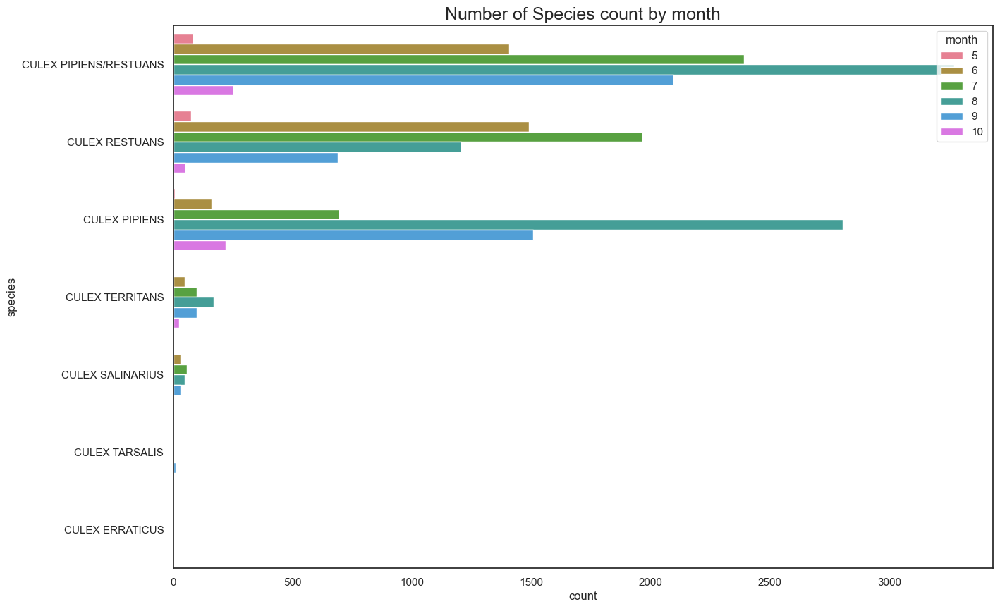

In [33]:
#species by month
species_month=df_train_weather[["month","species"]]
species_count_month=species_month.groupby("month").value_counts()
df_species_count_month=species_count_month.to_frame().reset_index()
df_species_count_month.rename(columns={0:"count"},inplace=True)

fig, ax = plt.subplots(1,1,figsize=(15,10))
sns.barplot(data=df_species_count_month, y="species", x='count',ax=ax,ci=None,palette = "husl",hue="month")
plt.title('Number of Species count by month', fontsize=18)
plt.show()

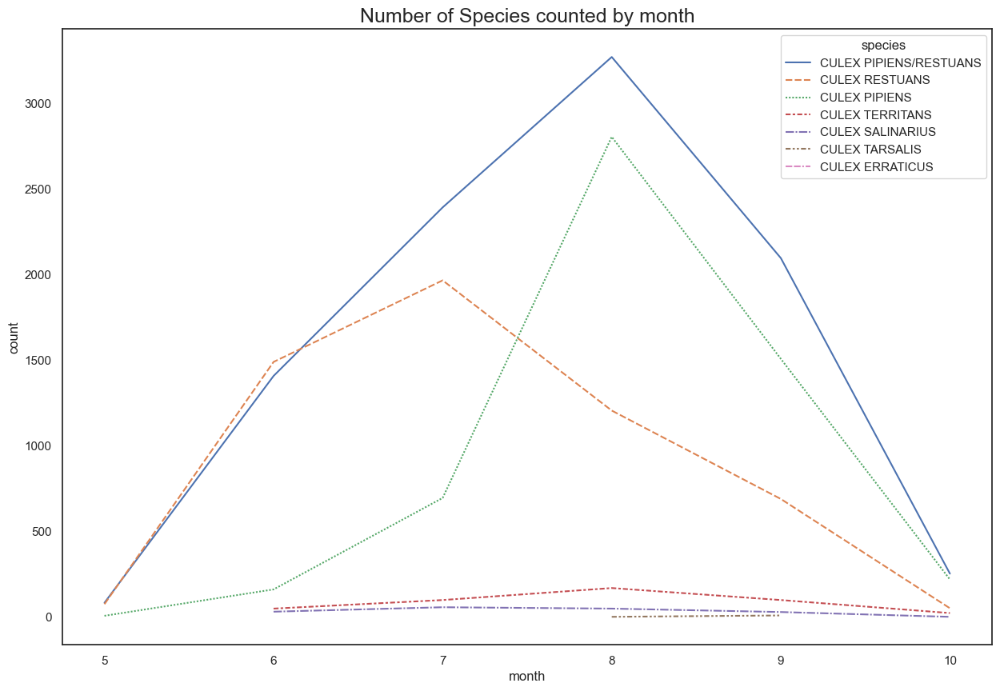

In [34]:
plt.figure(figsize=(15,10))
plt.title('Number of Species counted by month', fontsize=18)
sns.lineplot(data=df_species_count_month,x="month",y="count",hue="species",style="species");

From the above plot, it is observed that the number of culex pipiens/restuans peak at around August, which is the [summer period](https://www.calendarr.com/united-states/seasons-of-the-year-in-the-united-states/#:~:text=Summer%20lasts%20from%20June%2020,are%20longer%20than%20the%20evenings). It is observed that there is a high correlation between the number of mosquitos and the number of culex pipiens/restuans.

### Species by Year

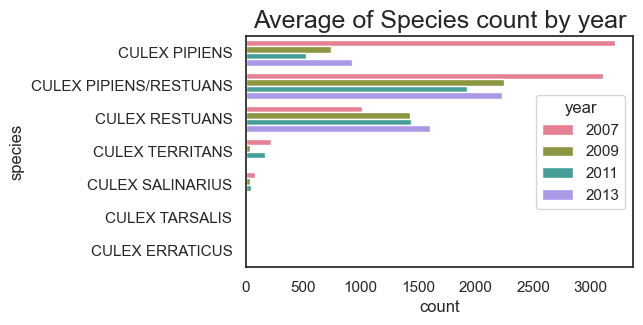

In [35]:
##species by year
species_year=df_train_weather[["year","species"]]
species_count_year=species_year.groupby("year").value_counts()

df_species_count_year=species_count_year.to_frame().reset_index()

df_species_count_year.rename(columns={0:"count"},inplace=True)

fig, ax = plt.subplots(1,1,figsize=(5,3))
sns.barplot(data=df_species_count_year, y="species", x='count',ax=ax,ci=None,palette = "husl",hue="year")
plt.title('Average of Species count by year', fontsize=18)
plt.show()

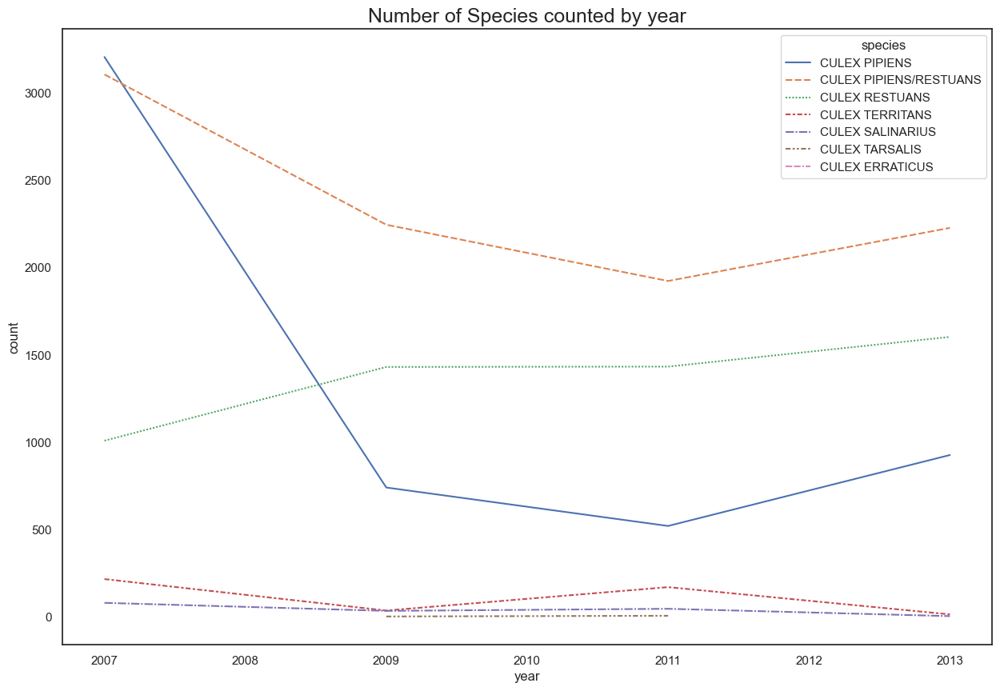

In [36]:
plt.figure(figsize=(15,10))
plt.title('Number of Species counted by year', fontsize=18)
sns.lineplot(data=df_species_count_year,x="year",y="count",hue="species",style="species");

From the graph above, it is observed that the overall number of mosquitos has been declining over the past few years.

### Species with wnvpresent

In [37]:
species_wnvpresent=df_train_weather[["species","wnvpresent"]]


species_wnvpresent_grouped=species_wnvpresent.groupby("species").value_counts()
df_species_count_grouped=species_wnvpresent_grouped.to_frame().reset_index()
df_species_count_grouped.rename(columns={0:"count"},inplace=True)


df_species_count_grouped["percentage"]=(df_species_count_grouped["count"]/(df_species_count_grouped["count"].sum()))*100

display(df_species_count_grouped[df_species_count_grouped["wnvpresent"]==1])

,species,wnvpresent,count,percentage
2,CULEX PIPIENS,1,480,2.284409
4,CULEX PIPIENS/RESTUANS,1,524,2.493813
6,CULEX RESTUANS,1,98,0.466400


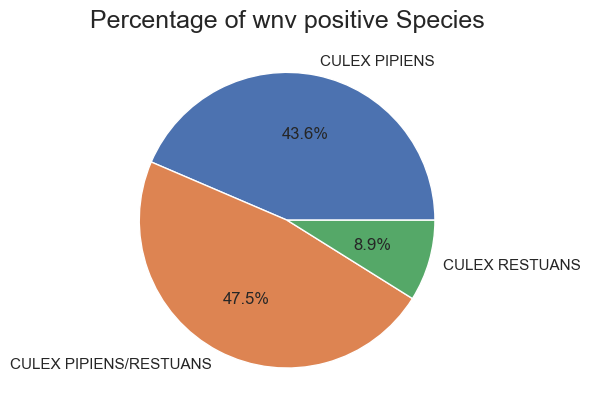

In [38]:
pos_species=df_species_count_grouped[df_species_count_grouped["wnvpresent"]==1]

plt.title('Percentage of wnv positive Species', fontsize=18)
labels=["CULEX PIPIENS","CULEX PIPIENS/RESTUANS","CULEX RESTUANS"]
plt.pie(pos_species["percentage"],labels=labels,autopct=lambda pct: func(pct,pos_species["count"]));

From the above pie chart, it is observed that culex pipens and culex pipiens/restruans are the most wnvpresent species.

## Overall Observations for EDA

1. In general, the plots for 2007 and 2013 showed more sharp peaks and decline because WNV was more prevalent in these years as seen from the bar plot at the beginning of our analysis. <br>
2. Temperature seems to play an important factor in the WNV. Higher temperatures (>60 degrees fahrenheit) would contributes to higher prevalence of WNV and number of mosquitoes with WNV.
3. Lower average and resultant wind speed (<10 mph) contributes to higher prevalence of WNV and number of mosquitoes with WNV.
4. Lower total precipitation (<1.0 inch) contributes to higher prevalence of WNV and number of mosquitoes with WNV.

These observations are in line with the favourable weather conditions for mosquitoes who can carry the WNV to breed in the US<a href="https://www.mayoclinic.org/diseases-conditions/west-nile-virus/symptoms-causes/syc-20350320" target="_blank"><sup>2</sup></a>.In the Summer, temperatures are hotter and mosquitoes would tend to breed better in such conditions. Mosquitoes also breed better in minimal standing water, which explains why low total precipitation is a contributing factor for WNV. 

One interesting insight would be that lower wind speeds seems to be a contributing factor for WNV. 

Studies have found that wind is an effective method against mosquitoes because<br>
(i) it prevents them from circling and landing on you<br>
(ii) wind dilutes and disperses the carbon dioxide you exhale and carbon dioxide is one of the major chemicals which attract mosquitoes; and<br>
(iii) wind cools you off from your sweat, lactic acid and body heat which attracts mosquitoes<a href="https://www.nytimes.com/2010/07/13/health/13real.html" target="_blank"><sup>3</sup></a>.

Another interesting insight will be that only a small percentage (<3%) of WNV is present in the mosquitios. The two mosquitos species that is tested WNV positive are culex pipens and culex restuans.